# import

In [1]:
from utils.recbole_train_test import *
from utils.plot_utils import *

# Experiment Palco - ET ND LS.t UD SF TO UM.100
executed train, random drift, leave one out train sampled, uniform neg sample training distribution, shuffle false, time ordering, uniform mode

In [2]:
SAVE_PATH, BASE_FILENAME, SPECS_STR = ('processed_datasets/natural_data/palco2010/', 
                                       'more_2interQ_df', 
                                        'no_drift')

BASE_DATASET_NAME = BASE_FILENAME+'_'+SPECS_STR

# MODEL_VERSIONS = ['_pt1', '_pt2', '_pt3', '_pt4']
freq=6 # month
duration = 2*12//freq # 2 years split in xM buckets
n_parts = duration*2+1
d_keys = ['_pt'+str(i) for i in range(1, n_parts)]
MODEL_VERSIONS = d_keys[:duration]


K = [1, 10, 20]
VALID_METRIC = 'Recall@'+str(K[1])
SEED = 2020
USE_GPU = False
SHOW_PROGRESS = True

# these are the default values
# TRAIN_NEG_SAMPLE_ARGS = {'distribution': 'uniform', 
#                          'sample_num': 1, 
#                          'alpha': 1.0, 
#                          'dynamic': False, 
#                          'candidate_num': 0}



SHUFFLE = False  # shuffle (bool): Whether or not to shuffle the training data before each epoch. Defaults to True.
EVAL_ARGS = {'split': {'LS': 'test_only'}, # leave-one-out sample type ['valid_and_test', 'valid_only', 'test_only']
                    'group_by': 'user',
                    'order': 'TO', # order (str): decides how we sort the data in .inter. random ordering or time ordering
                    'mode': 'uni100'}

FILENAME_VERSION = '_find_error_ET_ND_LS.t_UD_SF_TO_UM.100'

## BPR

### print model partitioning and mapping to evaluation

In [ ]:
model_name = 'BPR'
model_checkpoint_versions = {'_pt1':model_name+'-Mar-03-2025_15-47-46',
                             '_pt2':model_name+'-Mar-03-2025_15-50-30',
                             '_pt3':model_name+'-Mar-03-2025_16-03-36',
                             '_pt4':model_name+'-Mar-03-2025_16-21-46'}



for part in MODEL_VERSIONS:
    print('\n\n'+part)

    current_dataset_name = BASE_DATASET_NAME+part

    # Checkpoint - 
    model_checkpoint_ver = model_checkpoint_versions[part]
    model_checkpoint_dir = SAVE_PATH+BASE_DATASET_NAME+part
    model_checkpoint_file = model_checkpoint_dir+'/'+model_checkpoint_ver+'.pth'


    # get_test_three_main_diagonal_sections_with_names
    test_data_sections = get_test_data_sections_with_names(model_version=part,
                                            base_dataset_name=BASE_DATASET_NAME,
                                            models_versions=MODEL_VERSIONS)[:-1]
    print(test_data_sections)
    # pt8 yields IndexError: index out of range in self

    parameter_dict = {
        'dataset': current_dataset_name+'.inter',
        'use_gpu':USE_GPU,

        ## Environment settings https://recbole.io/docs/user_guide/config/environment_settings.html
        'seed':SEED,
        'state':'ERROR',
        'data_path': SAVE_PATH,
        # save_dataset (bool): Whether or not to save filtered dataset. If True, save filtered dataset, otherwise it will not be saved. Defaults to False
        'checkpoint_dir':model_checkpoint_dir,
        # 'show_progress': SHOW_PROGRESS,
        'shuffle': SHUFFLE,

        ## Data settings https://recbole.io/docs/user_guide/config/data_settings.html
        'load_col': {'inter': ['user_id', 'item_id', 'timestamp']},
        # 'user_inter_num_interval':'[1,inf)',
        
        ## Training settings https://recbole.io/docs/user_guide/config/training_settings.html
        
        ## Evaluation settings https://recbole.io/docs/user_guide/config/evaluation_settings.html
        'eval_args': EVAL_ARGS,
        # 'metrics': ['Recall', 'MRR', 'NDCG', 'Hit', 'Precision'], # default
        'topk':K,
        'valid_metric':VALID_METRIC          
    }


    # evaluate_on_data_sections_bpr(model_name=model_name,
    #                             model_checkpoint_file=model_checkpoint_file,
    #                             current_dataset_name=current_dataset_name,
    #                             test_data_sections=test_data_sections,
    #                             parameter_dict=parameter_dict,
    #                             filename_version=FILENAME_VERSION)
                            

### full data sec

In [3]:
model_name = 'BPR'


for part in MODEL_VERSIONS:
    print('\n\n'+part)
    dataset_name=BASE_DATASET_NAME+part
    parameter_dict = {
        'dataset': dataset_name+'.inter',
        'use_gpu':USE_GPU,

        ## Environment settings https://recbole.io/docs/user_guide/config/environment_settings.html
        'seed':SEED,
        'state':'ERROR',
        'data_path': SAVE_PATH,
        # save_dataset (bool): Whether or not to save filtered dataset. If True, save filtered dataset, otherwise it will not be saved. Defaults to False
        'checkpoint_dir':SAVE_PATH+dataset_name,
        # 'show_progress': SHOW_PROGRESS,
        'shuffle': SHUFFLE,

        ## Data settings https://recbole.io/docs/user_guide/config/data_settings.html
        'load_col': {'inter': ['user_id', 'item_id', 'timestamp']},
        # 'user_inter_num_interval':'[1,inf)',
        
        ## Training settings https://recbole.io/docs/user_guide/config/training_settings.html
        
        ## Evaluation settings https://recbole.io/docs/user_guide/config/evaluation_settings.html
        'eval_args': EVAL_ARGS,
        # 'metrics': ['Recall', 'MRR', 'NDCG', 'Hit', 'Precision'], # default
        'topk':K,
        'valid_metric':VALID_METRIC          
    }

    recbole_train_evaluate_bpr(model_name, dataset_name, parameter_dict, FILENAME_VERSION)




_pt1


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([3076, 5386, 9670,  ..., 1243, 9087, 2058])
pred= tensor([10.8431, -2.4974, -3.4546,  ...,  0.4672, -2.1345, -2.5415])
interaction= The batch_size of interaction: 4040
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([3076, 1517, 6301,

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([ 3076, 11371, 15964,  ...,  9585, 18978, 15132])
pred= tensor([17.4027, -3.7712, -5.6477,  ..., -6.6029, -8.1436, -7.6878])
interaction= The batch_size of interaction: 4040
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32


scores= tensor([[   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf, -2.2048,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        ...,
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([ 3076, 22035, 11160,  ..., 16483, 13092,   528])
pred= tensor([15.8400, -7.9983, -2.9173,  ..., -5.2332, -5.2336,  5.3982])
interaction= The batch_size of interaction: 4040
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([ 3076,  337

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([ 3076,  7311,  6932,  ..., 16241, 10285, 11057])
pred= tensor([17.5028,  4.1342, -5.3966,  ..., -4.9460, -1.6452, -5.3838])
interaction= The batch_size of interaction: 4040
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([ 3076,     

### evalute on test set

In [4]:
model_name = 'BPR'
model_checkpoint_versions = {'_pt1':model_name+'-Mar-07-2025_10-36-05',
                             '_pt2':model_name+'-Mar-07-2025_10-38-23',
                             '_pt3':model_name+'-Mar-07-2025_10-50-45',
                             '_pt4':model_name+'-Mar-07-2025_11-08-15'}



for part in MODEL_VERSIONS:
    print('\n\n'+part)

    current_dataset_name = BASE_DATASET_NAME+part

    # Checkpoint - 
    model_checkpoint_ver = model_checkpoint_versions[part]
    model_checkpoint_dir = SAVE_PATH+BASE_DATASET_NAME+part
    model_checkpoint_file = model_checkpoint_dir+'/'+model_checkpoint_ver+'.pth'


    # get_test_three_main_diagonal_sections_with_names
    test_full_data_sections = get_test_full_data_sections_with_names(model_version=part,
                                            base_dataset_name=BASE_DATASET_NAME,
                                            models_versions=MODEL_VERSIONS)[:-1]
    print(test_full_data_sections)
    

    parameter_dict = {
        'dataset': current_dataset_name+'.inter',
        'use_gpu':USE_GPU,

        ## Environment settings https://recbole.io/docs/user_guide/config/environment_settings.html
        'seed':SEED,
        'state':'ERROR',
        'data_path': SAVE_PATH,
        # save_dataset (bool): Whether or not to save filtered dataset. If True, save filtered dataset, otherwise it will not be saved. Defaults to False
        'checkpoint_dir':model_checkpoint_dir,
        # 'show_progress': SHOW_PROGRESS,
        'shuffle': SHUFFLE,

        ## Data settings https://recbole.io/docs/user_guide/config/data_settings.html
        'load_col': {'inter': ['user_id', 'item_id', 'timestamp']},
        # 'user_inter_num_interval':'[1,inf)',
        
        ## Training settings https://recbole.io/docs/user_guide/config/training_settings.html
        
        ## Evaluation settings https://recbole.io/docs/user_guide/config/evaluation_settings.html
        'eval_args': EVAL_ARGS,
        # 'metrics': ['Recall', 'MRR', 'NDCG', 'Hit', 'Precision'], # default
        'topk':K,
        'valid_metric':VALID_METRIC          
    }


    evaluate_on_data_sections_bpr(model_name=model_name,
                                model_checkpoint_file=model_checkpoint_file,
                                current_dataset_name=current_dataset_name,
                                test_data_sections=test_full_data_sections,
                                parameter_dict=parameter_dict,
                                filename_version=FILENAME_VERSION)
                            



_pt1
['more_2interQ_df_no_drift_pt2', 'more_2interQ_df_no_drift_pt3', 'more_2interQ_df_no_drift_pt4']


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value



more_2interQ_df_no_drift_pt2


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/palco2010/more_2interQ_df_no_drift_pt1/BPR_evaluation_results_model_pt1_section_pt2_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


more_2interQ_df_no_drift_pt3


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/palco2010/more_2interQ_df_no_drift_pt1/BPR_evaluation_results_model_pt1_section_pt3_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


more_2interQ_df_no_drift_pt4


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/palco2010/more_2interQ_df_no_drift_pt1/BPR_evaluation_results_model_pt1_section_pt4_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


_pt2
['more_2interQ_df_no_drift_pt1', 'more_2interQ_df_no_drift_pt3', 'more_2interQ_df_no_drift_pt4']


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value



more_2interQ_df_no_drift_pt1


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([ 3076,  9057,  7492,  ...,   477,  9024, 10121])
pred= tensor([17.4027, -5.2660, -8.1450,  ...,  2.7456, -4.1815, -7.2961])
interaction= The batch_size of interaction: 4040
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([3076, 1517,

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/palco2010/more_2interQ_df_no_drift_pt2/BPR_evaluation_results_model_pt2_section_pt3_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


more_2interQ_df_no_drift_pt4


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/palco2010/more_2interQ_df_no_drift_pt2/BPR_evaluation_results_model_pt2_section_pt4_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


_pt3
['more_2interQ_df_no_drift_pt1', 'more_2interQ_df_no_drift_pt2', 'more_2interQ_df_no_drift_pt4']


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value



more_2interQ_df_no_drift_pt1


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([ 3076,  9057,  7492,  ...,   477,  9024, 10121])
pred= tensor([ 15.8400,  -3.1564, -11.9084,  ...,   6.7370,  -7.2978,  -5.2693])
interaction= The batch_size of interaction: 4040
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([3076,

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([ 3076,  9057,  7492,  ..., 15950, 15329,  9904])
pred= tensor([ 15.8400,  -3.1564, -11.9084,  ...,  -6.5445,  -7.0870,  -0.9165])
interaction= The batch_size of interaction: 4040
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([ 3076

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/palco2010/more_2interQ_df_no_drift_pt3/BPR_evaluation_results_model_pt3_section_pt4_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


_pt4
['more_2interQ_df_no_drift_pt1', 'more_2interQ_df_no_drift_pt2', 'more_2interQ_df_no_drift_pt3']


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value



more_2interQ_df_no_drift_pt1


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([ 3076,  9057,  7492,  ...,   477,  9024, 10121])
pred= tensor([ 17.5028,  -5.2995, -10.0409,  ...,   3.0208,  -5.5127,  -6.1455])
interaction= The batch_size of interaction: 4040
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([3076,

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([ 3076,  9057,  7492,  ..., 15950, 15329,  9904])
pred= tensor([ 17.5028,  -5.2995, -10.0409,  ...,  -7.5650,  -7.5459,  -4.0041])
interaction= The batch_size of interaction: 4040
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([ 3076

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([ 3076,  9057,  7492,  ..., 22331, 19888, 13943])
pred= tensor([ 17.5028,  -5.2995, -10.0409,  ...,  -8.1086,  -8.5279,  -6.5232])
interaction= The batch_size of interaction: 4040
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([ 3076



 _pt1


 _pt2


 _pt3


 _pt4


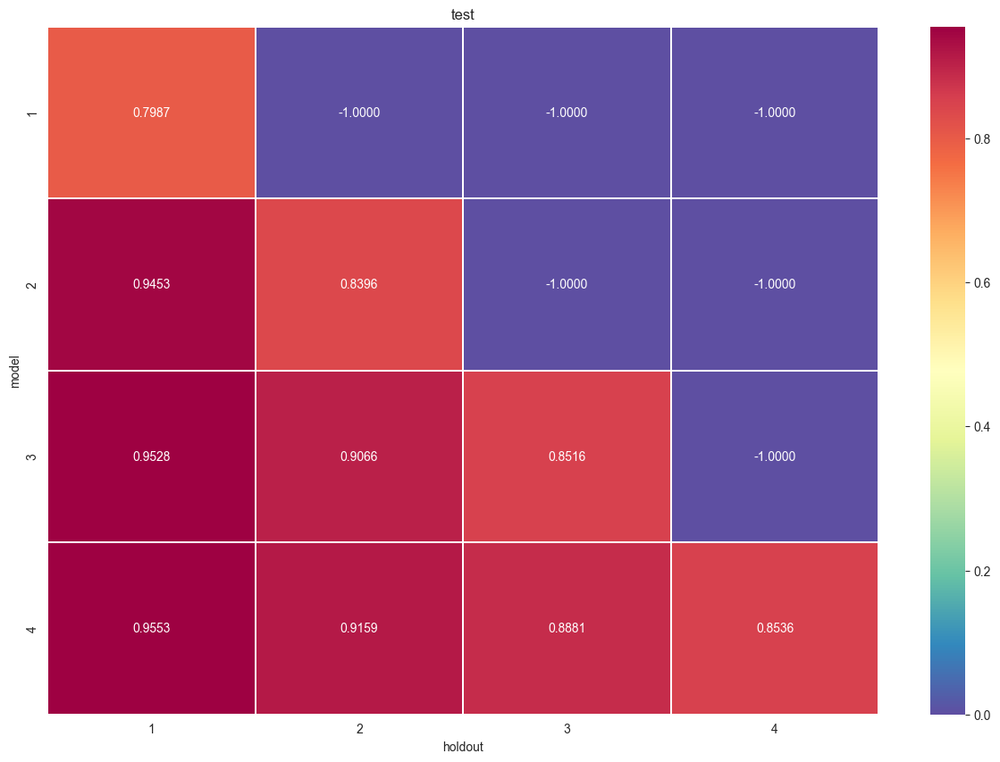

In [ ]:
model_name = 'BPR'
results_matrix = get_results_matrix(model_name=model_name,
                                    models_versions=MODEL_VERSIONS,
                                    base_dataset_name=BASE_DATASET_NAME,
                                    save_path=SAVE_PATH,
                                    metric='recall@'+str(K[1]),
                                    filename_version=FILENAME_VERSION,
                                    part_shift_incl=False,
                                    test_full_data_sec=True)

recall_heatmap(results_matrix, round_point=4, title='test', filepath=None)


# Experiment Goodreads - ET ND LS.t UD SF TO UM.100
executed train, random drift, leave one out train sampled, uniform neg sample training distribution, shuffle false, time ordering, uniform mode


In [3]:
SAVE_PATH, BASE_FILENAME, SPECS_STR = ('processed_datasets/natural_data/goodreads/inter_dedup_coldstart_3stars_4x714k/',
                                        'more_2interQ_df', 
                                        'no_drift')


BASE_DATASET_NAME = BASE_FILENAME+'_'+SPECS_STR

# MODEL_VERSIONS = ['_pt1', '_pt2', '_pt3', '_pt4']
freq=6 # month
duration = 2*12//freq # 2 years split in xM buckets
n_parts = duration*2+1
d_keys = ['_pt'+str(i) for i in range(1, n_parts)]
MODEL_VERSIONS = d_keys[:duration]


K = [1, 10, 20]
VALID_METRIC = 'Recall@'+str(K[1])
SEED = 2020
USE_GPU = False
SHOW_PROGRESS = True

# these are the default values
# TRAIN_NEG_SAMPLE_ARGS = {'distribution': 'uniform', 
#                          'sample_num': 1, 
#                          'alpha': 1.0, 
#                          'dynamic': False, 
#                          'candidate_num': 0}



SHUFFLE = False  # shuffle (bool): Whether or not to shuffle the training data before each epoch. Defaults to True.
EVAL_ARGS = {'split': {'LS': 'test_only'}, # leave-one-out sample type ['valid_and_test', 'valid_only', 'test_only']
                    'group_by': 'user',
                    'order': 'TO', # order (str): decides how we sort the data in .inter. random ordering or time ordering
                    'mode': 'uni100'}

FILENAME_VERSION = '_find_error_ET_ND_LS.t_UD_SF_TO_UM.100'

## BPR

In [3]:
model_name = 'BPR'


for part in MODEL_VERSIONS:
    print('\n\n'+part)
    dataset_name=BASE_DATASET_NAME+part
    parameter_dict = {
        'dataset': dataset_name+'.inter',
        'use_gpu':USE_GPU,

        ## Environment settings https://recbole.io/docs/user_guide/config/environment_settings.html
        'seed':SEED,
        'state':'ERROR',
        'data_path': SAVE_PATH,
        # save_dataset (bool): Whether or not to save filtered dataset. If True, save filtered dataset, otherwise it will not be saved. Defaults to False
        'checkpoint_dir':SAVE_PATH+dataset_name,
        # 'show_progress': SHOW_PROGRESS,
        'shuffle': SHUFFLE,

        ## Data settings https://recbole.io/docs/user_guide/config/data_settings.html
        'load_col': {'inter': ['user_id', 'item_id', 'timestamp']},
        # 'user_inter_num_interval':'[1,inf)',
        
        ## Training settings https://recbole.io/docs/user_guide/config/training_settings.html
        
        ## Evaluation settings https://recbole.io/docs/user_guide/config/evaluation_settings.html
        'eval_args': EVAL_ARGS,
        # 'metrics': ['Recall', 'MRR', 'NDCG', 'Hit', 'Precision'], # default
        'topk':K,
        'valid_metric':VALID_METRIC          
    }

    recbole_train_evaluate_bpr(model_name, dataset_name, parameter_dict, FILENAME_VERSION)




_pt1
Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  562, 24896, 12806,  ..., 25696,  7543,  8897])
pred= tensor([ 6.8688, -0.0304, -1.9740,  ..., -1.2530, -0.6093,  4.1574])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  562,  632

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  562, 53049, 13657,  ..., 60440, 47974, 32970])
pred= tensor([ 6.3752,  0.3721,  2.2143,  ..., -0.3610, -2.6771,  4.3357])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  562,  632

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  562, 25714, 19738,  ..., 38633, 65267, 49073])
pred= tensor([ 7.6073, -0.8158, -3.3764,  ..., -3.2151, -2.9445, -2.0744])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  562,  632

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  562, 78223, 76552,  ..., 23385, 90835, 53335])
pred= tensor([11.2033, -1.5267, -0.9770,  ...,  0.7764, -1.3809,  1.0952])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  562,  632

### evalute on test set

In [13]:
model_name = 'BPR'
model_checkpoint_versions = {'_pt1':model_name+'-Mar-07-2025_11-56-05',
                             '_pt2':model_name+'-Mar-07-2025_12-02-12',
                             '_pt3':model_name+'-Mar-07-2025_12-11-20',
                             '_pt4':model_name+'-Mar-07-2025_12-25-28'}



for part in MODEL_VERSIONS:
    print('\n\n'+part)

    current_dataset_name = BASE_DATASET_NAME+part

    # Checkpoint - 
    model_checkpoint_ver = model_checkpoint_versions[part]
    model_checkpoint_dir = SAVE_PATH+BASE_DATASET_NAME+part
    model_checkpoint_file = model_checkpoint_dir+'/'+model_checkpoint_ver+'.pth'


    # get_test_three_main_diagonal_sections_with_names
    test_full_data_sections = get_test_full_data_sections_with_names(model_version=part,
                                            base_dataset_name=BASE_DATASET_NAME,
                                            models_versions=MODEL_VERSIONS)[:-1]
    print(test_full_data_sections)
    

    parameter_dict = {
        'dataset': current_dataset_name+'.inter',
        'use_gpu':USE_GPU,

        ## Environment settings https://recbole.io/docs/user_guide/config/environment_settings.html
        'seed':SEED,
        'state':'ERROR',
        'data_path': SAVE_PATH,
        # save_dataset (bool): Whether or not to save filtered dataset. If True, save filtered dataset, otherwise it will not be saved. Defaults to False
        'checkpoint_dir':model_checkpoint_dir,
        # 'show_progress': SHOW_PROGRESS,
        'shuffle': SHUFFLE,

        ## Data settings https://recbole.io/docs/user_guide/config/data_settings.html
        'load_col': {'inter': ['user_id', 'item_id', 'timestamp']},
        # 'user_inter_num_interval':'[1,inf)',
        
        ## Training settings https://recbole.io/docs/user_guide/config/training_settings.html
        
        ## Evaluation settings https://recbole.io/docs/user_guide/config/evaluation_settings.html
        'eval_args': EVAL_ARGS,
        # 'metrics': ['Recall', 'MRR', 'NDCG', 'Hit', 'Precision'], # default
        'topk':K,
        'valid_metric':VALID_METRIC          
    }


    evaluate_on_data_sections_bpr(model_name=model_name,
                                model_checkpoint_file=model_checkpoint_file,
                                current_dataset_name=current_dataset_name,
                                test_data_sections=test_full_data_sections,
                                parameter_dict=parameter_dict,
                                filename_version=FILENAME_VERSION)



_pt1
['more_2interQ_df_no_drift_pt2', 'more_2interQ_df_no_drift_pt3', 'more_2interQ_df_no_drift_pt4']


more_2interQ_df_no_drift_pt2


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/goodreads/inter_dedup_coldstart_3stars_4x714k/more_2interQ_df_no_drift_pt1/BPR_evaluation_results_model_pt1_section_pt2_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


more_2interQ_df_no_drift_pt3


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/goodreads/inter_dedup_coldstart_3stars_4x714k/more_2interQ_df_no_drift_pt1/BPR_evaluation_results_model_pt1_section_pt3_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


more_2interQ_df_no_drift_pt4


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/goodreads/inter_dedup_coldstart_3stars_4x714k/more_2interQ_df_no_drift_pt1/BPR_evaluation_results_model_pt1_section_pt4_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


_pt2
['more_2interQ_df_no_drift_pt1', 'more_2interQ_df_no_drift_pt3', 'more_2interQ_df_no_drift_pt4']


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value



more_2interQ_df_no_drift_pt1


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  562, 41825, 40260,  ...,   429,  9389, 19001])
pred= tensor([ 6.3752e+00, -1.6860e+00,  6.3020e-03,  ...,  2.1532e+00,
        -4.0041e+00, -4.1071e+00])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39])

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/goodreads/inter_dedup_coldstart_3stars_4x714k/more_2interQ_df_no_drift_pt2/BPR_evaluation_results_model_pt2_section_pt3_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


more_2interQ_df_no_drift_pt4


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/goodreads/inter_dedup_coldstart_3stars_4x714k/more_2interQ_df_no_drift_pt2/BPR_evaluation_results_model_pt2_section_pt4_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


_pt3
['more_2interQ_df_no_drift_pt1', 'more_2interQ_df_no_drift_pt2', 'more_2interQ_df_no_drift_pt4']


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value



more_2interQ_df_no_drift_pt1


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  562, 41825, 40260,  ...,   429,  9389, 19001])
pred= tensor([ 7.6073, -4.3837,  4.4733,  ...,  0.8732, -6.0304, -2.4738])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  562,  632

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  562, 41825, 40260,  ...,  4864, 55406, 42594])
pred= tensor([ 7.6073, -4.3837,  4.4733,  ..., -3.4950, -4.6498, -3.5355])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  562,  632

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/goodreads/inter_dedup_coldstart_3stars_4x714k/more_2interQ_df_no_drift_pt3/BPR_evaluation_results_model_pt3_section_pt4_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


_pt4
['more_2interQ_df_no_drift_pt1', 'more_2interQ_df_no_drift_pt2', 'more_2interQ_df_no_drift_pt3']


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value



more_2interQ_df_no_drift_pt1


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  562, 41825, 40260,  ...,   429,  9389, 19001])
pred= tensor([11.2033, -2.3194,  5.0875,  ..., -5.2498,  2.9690, -1.5105])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  562,  632

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  562, 41825, 40260,  ...,  4864, 55406, 42594])
pred= tensor([11.2033, -2.3194,  5.0875,  ..., -1.8913, -3.5830, -3.0143])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  562,  632

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  562, 41825, 61833,  ..., 51289, 30108, 71282])
pred= tensor([11.2033, -2.3194, -2.6357,  ...,  0.0650, -0.9538,  0.8109])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  562,  632

### recall heatmap



 _pt1


 _pt2


 _pt3


 _pt4


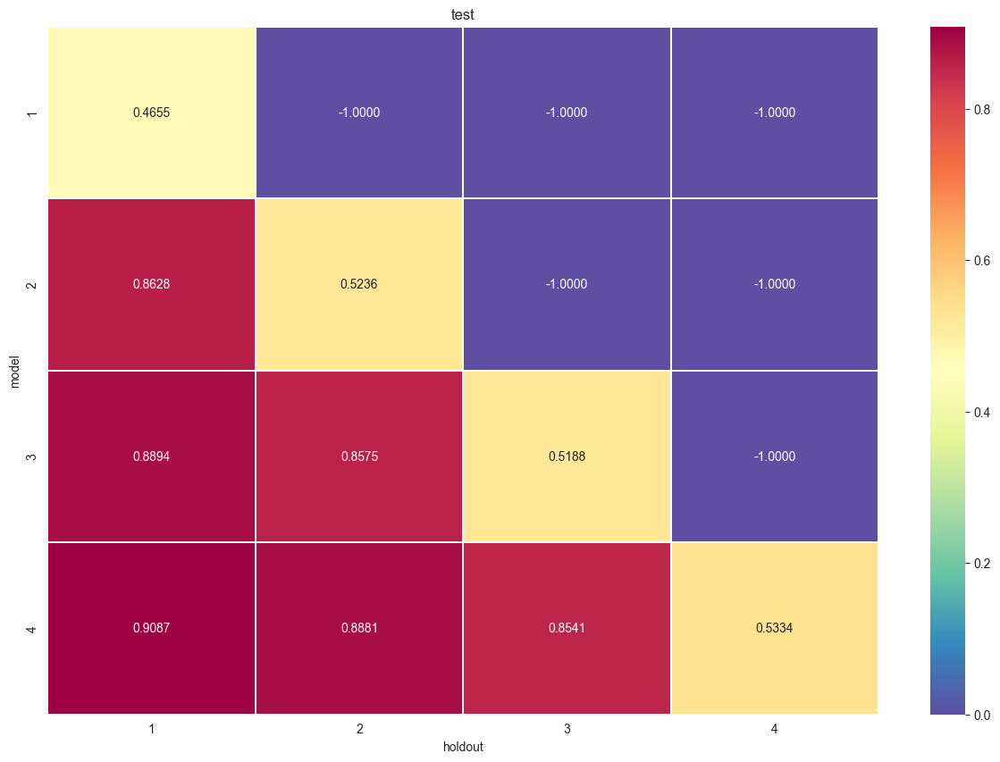

In [14]:
model_name = 'BPR'
results_matrix = get_results_matrix(model_name=model_name,
                                    models_versions=MODEL_VERSIONS,
                                    base_dataset_name=BASE_DATASET_NAME,
                                    save_path=SAVE_PATH,
                                    metric='recall@'+str(K[1]),
                                    filename_version=FILENAME_VERSION,
                                    part_shift_incl=False,
                                    test_full_data_sec=True)

recall_heatmap(results_matrix, round_point=4, title='test', filepath=None)

In [4]:
model_name = 'BPR'


for part in MODEL_VERSIONS:
    print('\n\n'+part)
    dataset_name=BASE_DATASET_NAME+part
    parameter_dict = {
        'dataset': dataset_name+'.inter',
        'use_gpu':USE_GPU,

        ## Environment settings https://recbole.io/docs/user_guide/config/environment_settings.html
        'seed':SEED,
        'state':'ERROR',
        'data_path': SAVE_PATH,
        'save_dataset': True,# save_dataset (bool): Whether or not to save filtered dataset. If True, save filtered dataset, otherwise it will not be saved. Defaults to False
        'checkpoint_dir':SAVE_PATH+dataset_name,
        # 'show_progress': SHOW_PROGRESS,
        'shuffle': SHUFFLE,

        ## Data settings https://recbole.io/docs/user_guide/config/data_settings.html
        'load_col': {'inter': ['user_id', 'item_id', 'timestamp']},
        # 'user_inter_num_interval':'[1,inf)',
        
        ## Training settings https://recbole.io/docs/user_guide/config/training_settings.html
        
        ## Evaluation settings https://recbole.io/docs/user_guide/config/evaluation_settings.html
        'eval_args': EVAL_ARGS,
        # 'metrics': ['Recall', 'MRR', 'NDCG', 'Hit', 'Precision'], # default
        'topk':K,
        'valid_metric':VALID_METRIC          
    }

    recbole_train_evaluate_bpr(model_name, dataset_name, parameter_dict, FILENAME_VERSION)




_pt1
Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.



KeyboardInterrupt: 

In [ ]:
more_2interQ_df_no_drift_pt1-Dataset.pth

# Experiment ADM - ET ND LS.t UD SF TO UM.100
executed train, random drift, leave one out train sampled, uniform neg sample training distribution, shuffle false, time ordering, uniform mode


In [9]:
SAVE_PATH, BASE_FILENAME, SPECS_STR = ('processed_datasets/natural_data/adm/',
                                        'more_2interQ_df', 
                                        'no_drift')


BASE_DATASET_NAME = BASE_FILENAME+'_'+SPECS_STR

# MODEL_VERSIONS = ['_pt1', '_pt2', '_pt3', '_pt4']
freq=6 # month
duration = 2*12//freq # 2 years split in xM buckets
n_parts = duration*2+1
d_keys = ['_pt'+str(i) for i in range(1, n_parts)]
MODEL_VERSIONS = d_keys[:duration]


K = [1, 10, 20]
VALID_METRIC = 'Recall@'+str(K[1])
SEED = 2020
USE_GPU = False
SHOW_PROGRESS = True

# these are the default values
# TRAIN_NEG_SAMPLE_ARGS = {'distribution': 'uniform', 
#                          'sample_num': 1, 
#                          'alpha': 1.0, 
#                          'dynamic': False, 
#                          'candidate_num': 0}



SHUFFLE = False  # shuffle (bool): Whether or not to shuffle the training data before each epoch. Defaults to True.
EVAL_ARGS = {'split': {'LS': 'test_only'}, # leave-one-out sample type ['valid_and_test', 'valid_only', 'test_only']
                    'group_by': 'user',
                    'order': 'TO', # order (str): decides how we sort the data in .inter. random ordering or time ordering
                    'mode': 'uni100'}

FILENAME_VERSION = '_find_error_ET_ND_LS.t_UD_SF_TO_UM.100'

## BPR

In [5]:
model_name = 'BPR'


for part in MODEL_VERSIONS:
    print('\n\n'+part)
    dataset_name=BASE_DATASET_NAME+part
    parameter_dict = {
        'dataset': dataset_name+'.inter',
        'use_gpu':USE_GPU,

        ## Environment settings https://recbole.io/docs/user_guide/config/environment_settings.html
        'seed':SEED,
        'state':'ERROR',
        'data_path': SAVE_PATH,
        # save_dataset (bool): Whether or not to save filtered dataset. If True, save filtered dataset, otherwise it will not be saved. Defaults to False
        'checkpoint_dir':SAVE_PATH+dataset_name,
        # 'show_progress': SHOW_PROGRESS,
        'shuffle': SHUFFLE,

        ## Data settings https://recbole.io/docs/user_guide/config/data_settings.html
        'load_col': {'inter': ['user_id', 'item_id', 'timestamp']},
        # 'user_inter_num_interval':'[1,inf)',
        
        ## Training settings https://recbole.io/docs/user_guide/config/training_settings.html
        
        ## Evaluation settings https://recbole.io/docs/user_guide/config/evaluation_settings.html
        'eval_args': EVAL_ARGS,
        # 'metrics': ['Recall', 'MRR', 'NDCG', 'Hit', 'Precision'], # default
        'topk':K,
        'valid_metric':VALID_METRIC          
    }

    recbole_train_evaluate_bpr(model_name, dataset_name, parameter_dict, FILENAME_VERSION)




_pt1


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([    1,  8217,  1380,  ..., 21636, 16940, 17273])
pred= tensor([ 7.4603,  0.0221, -0.9292,  ...,  0.0224,  0.1411,  1.7709])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[  -inf, 7.4603,   -inf,  ...,   -inf,   -inf,   -inf],
        [  -inf,   -inf,   -inf,  ...,   -inf,   -inf,   -inf],
        [  -inf,   -inf,   -inf,  ...,   -inf,   -inf,   -inf],
        ...,
        [  -inf,   -inf,   -inf,  ...,   -inf,   -inf,   -inf],
        [  -inf,   -inf,   -inf,  ...,   -inf,   -inf,   -inf],
        [  -inf,   -inf,   -inf,  ...,   -inf,   -inf,   -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  168, 51962, 41066,  ...,  5684, 39866, 34219])
pred= tensor([-0.1532, -0.7305,  0.3487,  ..., -0.0097,  2.0435,  2.4872])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  168,    4

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  168,   197, 28082,  ..., 14514, 48859,  5549])
pred= tensor([-0.2982, -4.4413,  0.3449,  ..., -1.2038,  0.6163,  2.1881])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  168,    4

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

Entered Trainer fit function. Model is being trained.


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:235: FutureWarning:

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.





Training best results
best_valid_score:  -inf
best_valid_result:  None


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\trainer\trainer.py:705: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  168, 40452,  8363,  ..., 25403, 32194, 39741])
pred= tensor([-0.0617,  0.0995, -1.1808,  ...,  2.0982, -1.6306,  0.6918])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  168,    4

### evalute on test set

In [10]:
model_name = 'BPR'
model_checkpoint_versions = {'_pt1':model_name+'-Mar-07-2025_12-45-54',
                             '_pt2':model_name+'-Mar-07-2025_12-47-54',
                             '_pt3':model_name+'-Mar-07-2025_12-59-47',
                             '_pt4':model_name+'-Mar-07-2025_13-18-14'}



for part in MODEL_VERSIONS:
    print('\n\n'+part)

    current_dataset_name = BASE_DATASET_NAME+part

    # Checkpoint - 
    model_checkpoint_ver = model_checkpoint_versions[part]
    model_checkpoint_dir = SAVE_PATH+BASE_DATASET_NAME+part
    model_checkpoint_file = model_checkpoint_dir+'/'+model_checkpoint_ver+'.pth'


    # get_test_three_main_diagonal_sections_with_names
    test_full_data_sections = get_test_full_data_sections_with_names(model_version=part,
                                            base_dataset_name=BASE_DATASET_NAME,
                                            models_versions=MODEL_VERSIONS)[:-1]
    print(test_full_data_sections)
    

    parameter_dict = {
        'dataset': current_dataset_name+'.inter',
        'use_gpu':USE_GPU,

        ## Environment settings https://recbole.io/docs/user_guide/config/environment_settings.html
        'seed':SEED,
        'state':'ERROR',
        'data_path': SAVE_PATH,
        # save_dataset (bool): Whether or not to save filtered dataset. If True, save filtered dataset, otherwise it will not be saved. Defaults to False
        'checkpoint_dir':model_checkpoint_dir,
        # 'show_progress': SHOW_PROGRESS,
        'shuffle': SHUFFLE,

        ## Data settings https://recbole.io/docs/user_guide/config/data_settings.html
        'load_col': {'inter': ['user_id', 'item_id', 'timestamp']},
        # 'user_inter_num_interval':'[1,inf)',
        
        ## Training settings https://recbole.io/docs/user_guide/config/training_settings.html
        
        ## Evaluation settings https://recbole.io/docs/user_guide/config/evaluation_settings.html
        'eval_args': EVAL_ARGS,
        # 'metrics': ['Recall', 'MRR', 'NDCG', 'Hit', 'Precision'], # default
        'topk':K,
        'valid_metric':VALID_METRIC          
    }


    evaluate_on_data_sections_bpr(model_name=model_name,
                                model_checkpoint_file=model_checkpoint_file,
                                current_dataset_name=current_dataset_name,
                                test_data_sections=test_full_data_sections,
                                parameter_dict=parameter_dict,
                                filename_version=FILENAME_VERSION)



_pt1
['more_2interQ_df_no_drift_pt2', 'more_2interQ_df_no_drift_pt3', 'more_2interQ_df_no_drift_pt4']


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value



more_2interQ_df_no_drift_pt2


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/adm/more_2interQ_df_no_drift_pt1/BPR_evaluation_results_model_pt1_section_pt2_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


more_2interQ_df_no_drift_pt3


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/adm/more_2interQ_df_no_drift_pt1/BPR_evaluation_results_model_pt1_section_pt3_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


more_2interQ_df_no_drift_pt4


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/adm/more_2interQ_df_no_drift_pt1/BPR_evaluation_results_model_pt1_section_pt4_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


_pt2
['more_2interQ_df_no_drift_pt1', 'more_2interQ_df_no_drift_pt3', 'more_2interQ_df_no_drift_pt4']


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value



more_2interQ_df_no_drift_pt1


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([    1,  9057,  7492,  ..., 16985, 13061, 13066])
pred= tensor([10.5289,  1.1678, -0.3156,  ...,  0.8011,  0.9517,  2.2688])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[   -inf, 10.5289,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        ...,
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/adm/more_2interQ_df_no_drift_pt2/BPR_evaluation_results_model_pt2_section_pt3_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


more_2interQ_df_no_drift_pt4


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/adm/more_2interQ_df_no_drift_pt2/BPR_evaluation_results_model_pt2_section_pt4_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


_pt3
['more_2interQ_df_no_drift_pt1', 'more_2interQ_df_no_drift_pt2', 'more_2interQ_df_no_drift_pt4']


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value



more_2interQ_df_no_drift_pt1


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([    1,  9057,  7492,  ..., 16985, 13061, 13066])
pred= tensor([11.5810,  0.6553,  1.5669,  ..., -0.4821,  2.2235, -0.9497])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[   -inf, 11.5810,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        ...,
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  168, 41825, 40260,  ..., 17742, 23306, 52932])
pred= tensor([-0.2982, -3.5603, -0.7664,  ...,  1.9677, -0.3135,  0.0574])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  168,    4

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

An exception occurred: IndexError
OrderedDict([('recall@10', -1)])
Saved file at processed_datasets/natural_data/adm/more_2interQ_df_no_drift_pt3/BPR_evaluation_results_model_pt3_section_pt4_find_error_ET_ND_LS.t_UD_SF_TO_UM.100.pkl


_pt4
['more_2interQ_df_no_drift_pt1', 'more_2interQ_df_no_drift_pt2', 'more_2interQ_df_no_drift_pt3']


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value



more_2interQ_df_no_drift_pt1


c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([    1,  9057,  7492,  ..., 16985, 13061, 13066])
pred= tensor([12.6487, -0.5228, -1.0883,  ...,  2.1096, -0.8720, -1.8242])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[   -inf, 12.6487,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        ...,
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf],
        [   -inf,    -inf,    -inf,  ...,    -inf,    -inf,    -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  168, 41825, 40260,  ..., 17742, 23306, 52932])
pred= tensor([-0.0617, -1.1714,  0.0239,  ..., -0.0437, -2.4496,  0.4208])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  168,    4

c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:648: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



c:\Users\mjlav\anaconda3\envs\algorithms_transparency\lib\site-packages\recbole\data\dataset\dataset.py:650: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

user= tensor([ 1,  1,  1,  ..., 40, 40, 40]) item= tensor([  168, 41825, 61833,  ..., 35449, 12284, 67951])
pred= tensor([-0.0617, -1.1714,  0.0338,  ...,  1.9560, -0.2513,  0.4730])
interaction= The batch_size of interaction: 4040
    user_id, torch.Size([4040]), cpu, torch.int64
    timestamp, torch.Size([4040]), cpu, torch.float32
    label, torch.Size([4040]), cpu, torch.float32
    item_id, torch.Size([4040]), cpu, torch.int64


scores= tensor([[-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        ...,
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf],
        [-inf, -inf, -inf,  ..., -inf, -inf, -inf]])
positive_u= tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39]) positive_i= tensor([  168,    4

### recall heatmap



 _pt1


 _pt2


 _pt3


 _pt4


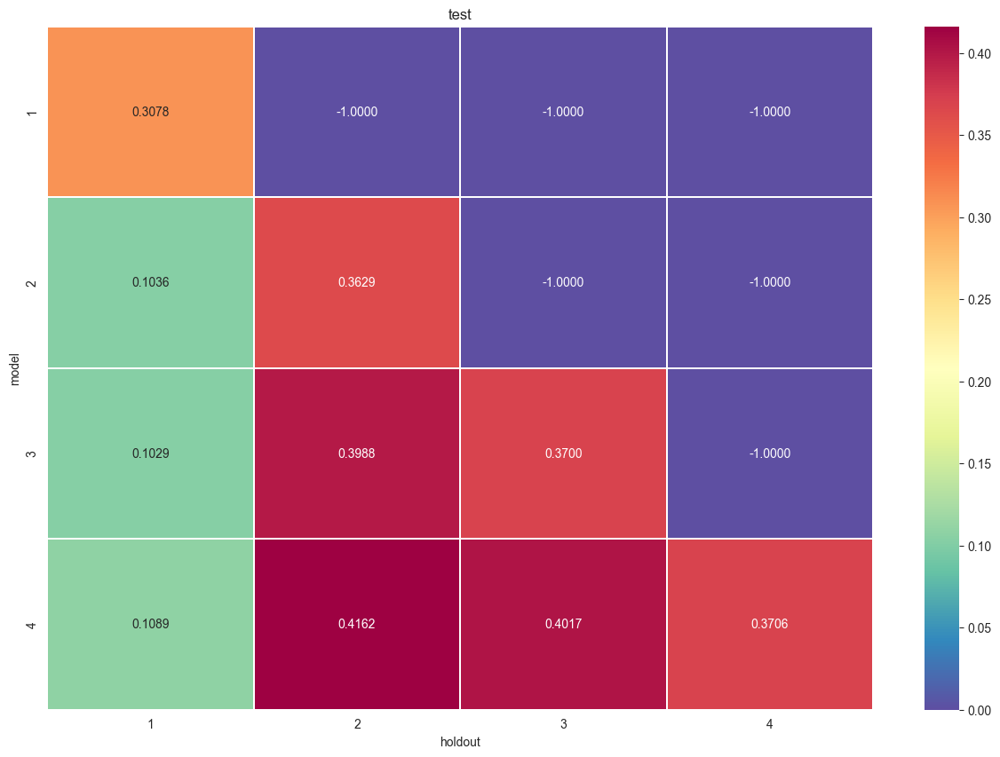

In [11]:
model_name = 'BPR'
results_matrix = get_results_matrix(model_name=model_name,
                                    models_versions=MODEL_VERSIONS,
                                    base_dataset_name=BASE_DATASET_NAME,
                                    save_path=SAVE_PATH,
                                    metric='recall@'+str(K[1]),
                                    filename_version=FILENAME_VERSION,
                                    part_shift_incl=False,
                                    test_full_data_sec=True)

recall_heatmap(results_matrix, round_point=4, title='test', filepath=None)